In [15]:
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D,MaxPool2D,Dropout,Flatten,Dense,BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load Data 

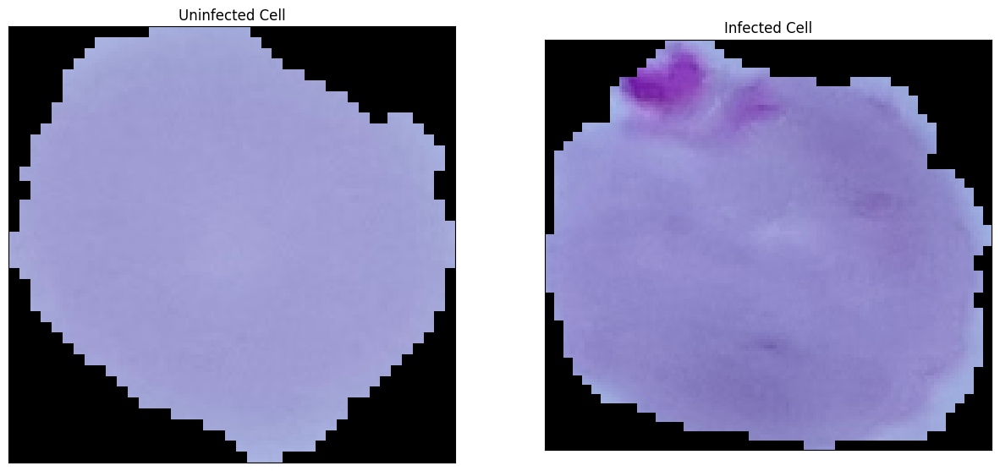

In [17]:
import cv2

upic='C:/Users/ihsan/Downloads/cell_images/Uninfected/C94P55ThinF_IMG_20150821_165118_cell_56.png'
apic='C:/Users/ihsan/Downloads/cell_images/Parasitized/C99P60ThinF_IMG_20150918_141620_cell_2.png'
plt.figure(1, figsize = (15 , 7))
plt.subplot(1 , 2 , 1)
plt.imshow(cv2.imread(upic))
plt.title('Uninfected Cell')
plt.xticks([]) , plt.yticks([])

plt.subplot(1 , 2 , 2)
plt.imshow(cv2.imread(apic))
plt.title('Infected Cell')
plt.xticks([]) , plt.yticks([])

plt.show()

# Data Cleaning

In [18]:
#Ngeresize ukurannya jadi 128x128
width = 128
height = 128

In [19]:
#Buat normalisasi supaya cuman di rentang 0-1
datagen = ImageDataGenerator(rescale=1/255.0, validation_split=0.2)

# Splitting Data

In [20]:
trainDatagen = datagen.flow_from_directory(directory='C:/Users/ihsan/Downloads/cell_images/cell_images',
                                           target_size=(width,height),
                                           class_mode = 'binary',
                                           batch_size = 256,
                                           subset='training')

Found 22048 images belonging to 2 classes.


In [21]:
valDatagen = datagen.flow_from_directory(directory='C:/Users/ihsan/Downloads/cell_images/cell_images',
                                           target_size=(width,height),
                                           class_mode = 'binary',
                                           batch_size = 256,
                                           subset='validation')

Found 5510 images belonging to 2 classes.


Batch images shape: (256, 128, 128, 3)
Batch labels: [1. 1. 1. 0. 1. 0. 0. 0. 0. 1. 1. 1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 1. 1.
 1. 0. 0. 0. 1. 1. 0. 1. 1. 0. 1. 0. 1. 1. 1. 0. 0. 0. 1. 0. 1. 1. 1. 0.
 1. 0. 1. 1. 1. 0. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0. 1. 1. 0. 1. 0.
 1. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 0. 1. 1. 1. 0. 1. 1.
 1. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 1. 1. 0.
 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 1. 0. 1. 1. 1. 1. 0. 0. 0. 0. 0. 1. 0. 1.
 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 1. 1. 0. 1. 1. 1. 0. 0. 0.
 0. 1. 0. 0. 1. 1. 1. 0. 1. 1. 0. 0. 1. 0. 1. 0. 0. 1. 0. 0. 0. 0. 1. 0.
 1. 1. 1. 1. 0. 1. 1. 1. 0. 1. 0. 0. 0. 1. 1. 0. 0. 0. 1. 1. 0. 1. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 1.
 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1.]


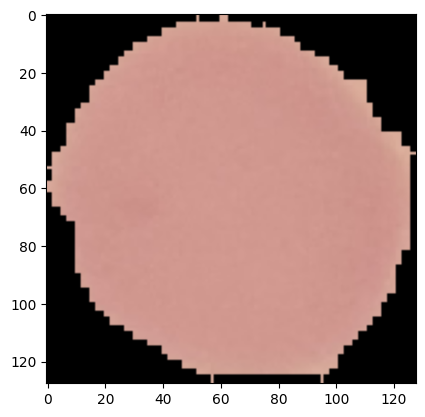

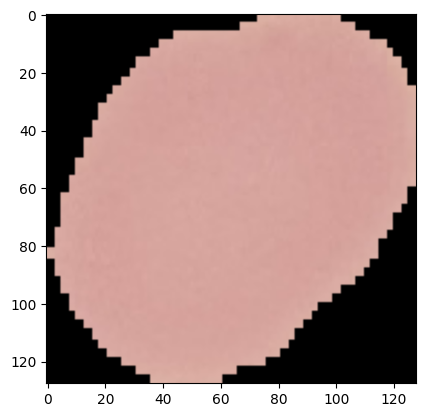

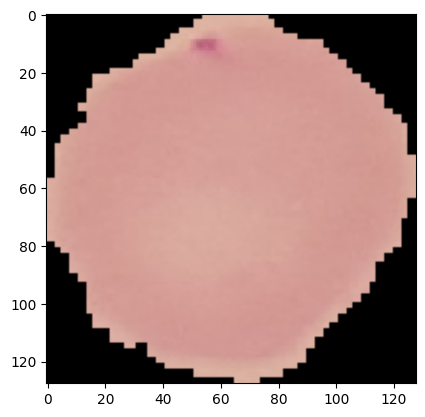

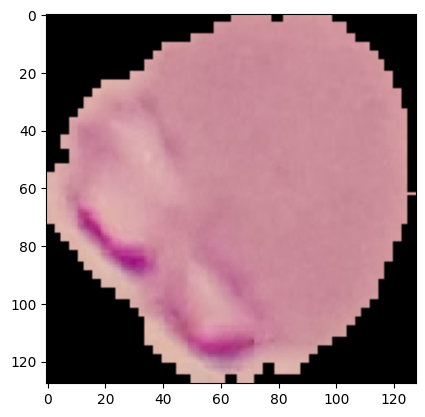

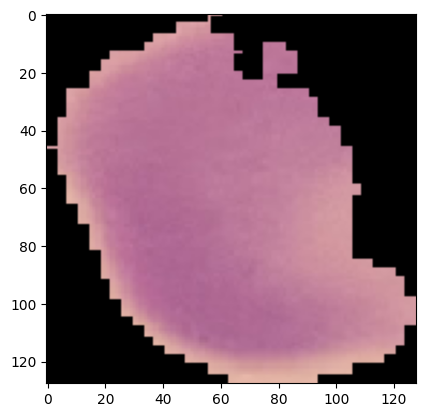

...

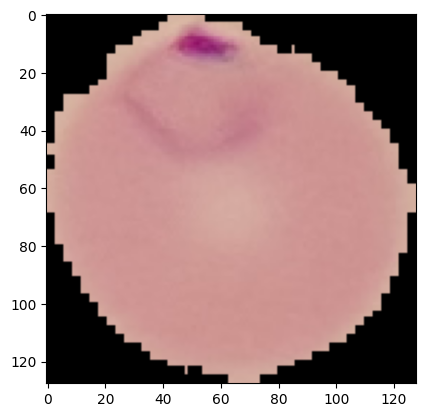

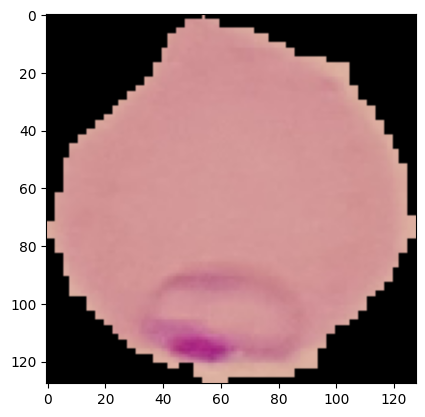

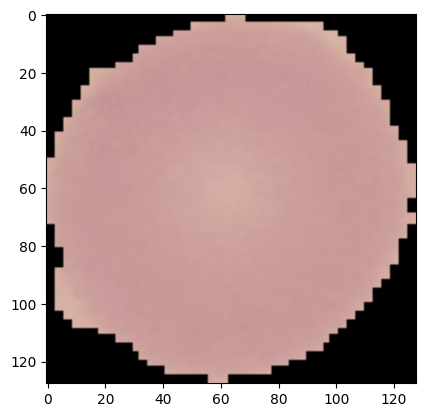

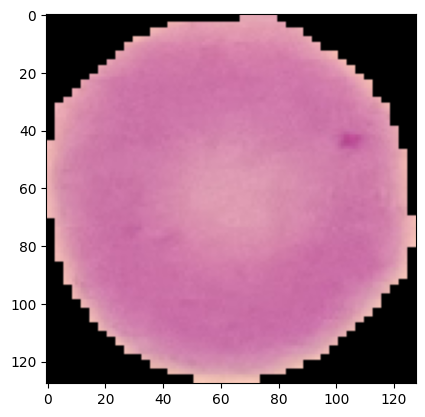

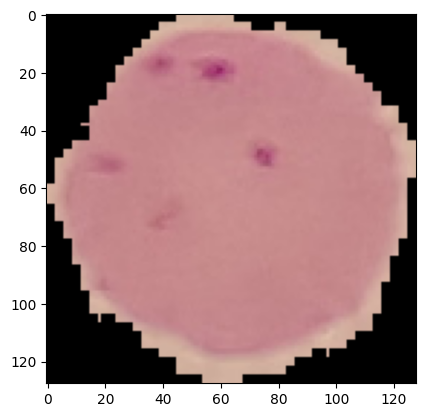

In [22]:
for images, labels in valDatagen:

    print("Batch images shape:", images.shape)
    print("Batch labels:", labels)


    for image in images:
  
        plt.imshow(image)
        plt.show()

 
    break


# Modelling

In [23]:
model = Sequential()
model.add(Conv2D(16,(3,3),activation='relu',input_shape=(128,128,3)))
model.add(MaxPool2D(2,2))
model.add(Dropout(0.2))

model.add(Conv2D(32,(3,3),activation='relu'))
model.add(MaxPool2D(2,2))
model.add(Dropout(0.3))

model.add(Conv2D(64,(3,3),activation='relu'))
model.add(MaxPool2D(2,2))
model.add(Dropout(0.3))

model.add(Flatten())
model.add(Dense(64,activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(1,activation='sigmoid'))

In [24]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 63, 63, 16)       0         
 2D)                                                             
                                                                 
 dropout_4 (Dropout)         (None, 63, 63, 16)        0         
                                                                 
 conv2d_4 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 30, 30, 32)       0         
 2D)                                                             
                                                                 
 dropout_5 (Dropout)         (None, 30, 30, 32)       

In [25]:
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

In [26]:
early_stop = EarlyStopping(monitor='val_loss',patience=2)

In [27]:
history = model.fit_generator(generator = trainDatagen,
                             steps_per_epoch = len(trainDatagen),
                              epochs =20,
                              validation_data = valDatagen,
                              validation_steps=len(valDatagen),
                             callbacks=[early_stop])

C:\Users\ihsan\AppData\Local\Temp\ipykernel_13628\3717032350.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(generator = trainDatagen,


Epoch 1/20
87/87 [==============================] - 176s 2s/step - loss: 0.7013 - accuracy: 0.5317 - val_loss: 0.6489 - val_accuracy: 0.7080
Epoch 2/20
87/87 [==============================] - 93s 1s/step - loss: 0.6002 - accuracy: 0.6826 - val_loss: 0.4416 - val_accuracy: 0.8757
Epoch 3/20
87/87 [==============================] - 91s 1s/step - loss: 0.3335 - accuracy: 0.8995 - val_loss: 0.2638 - val_accuracy: 0.9330
Epoch 4/20
87/87 [==============================] - 90s 1s/step - loss: 0.2517 - accuracy: 0.9329 - val_loss: 0.2024 - val_accuracy: 0.9405
Epoch 5/20
87/87 [==============================] - 92s 1s/step - loss: 0.2254 - accuracy: 0.9423 - val_loss: 0.1922 - val_accuracy: 0.9394
Epoch 6/20
87/87 [==============================] - 92s 1s/step - loss: 0.2081 - accuracy: 0.9458 - val_loss: 0.1792 - val_accuracy: 0.9388
Epoch 7/20
87/87 [==============================] - 98s 1s/step - loss: 0.1953 - accuracy: 0.9502 - val_loss: 0.1845 - val_accuracy: 0.9392
Epoch 8/20
87/87 [=

<function matplotlib.pyplot.show(close=None, block=None)>

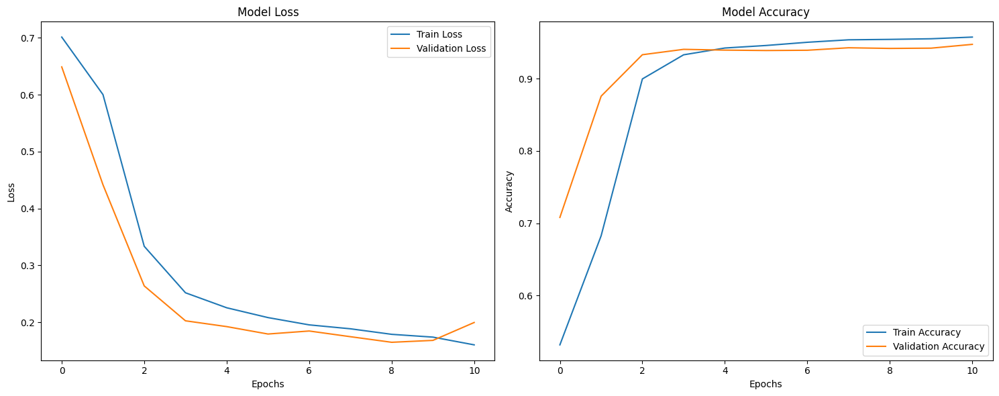

In [28]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 6))

# Plot model loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot model accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Adjust spacing between subplots
plt.tight_layout()

# Display the combined plot
plt.show